#### Bad sets

- 0184
- 0996
- 0348
- 0381
- 0542
- 0572
- 0640 (Wrong)
- 0419

Found 14 images


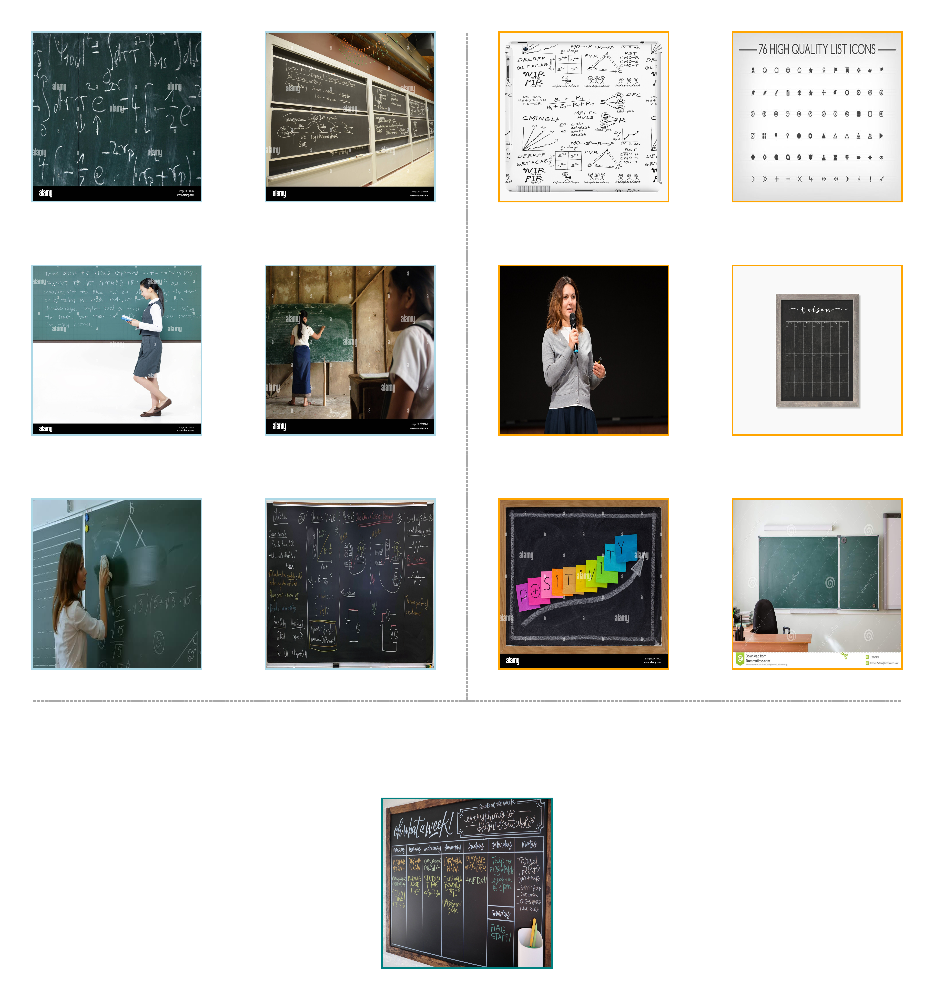

In [14]:
import os
from PIL import Image, ImageDraw
from IPython.display import Image as IPImage, display

class BongardCanvas:
    def __init__(self, grid_size=(1024, 1024), padding=200, between_padding=400, query_padding=800, border_width=10):
        self.grid_width, self.grid_height = grid_size
        self.padding = padding  # outer padding (top/bottom/left/right)
        self.between_padding = between_padding  # padding between images
        self.query_padding = query_padding  # padding between context and query sections
        self.border_width = border_width
    
    def add_border(self, img, color='blue'):
        """Add a colored border around an image"""
        bordered_img = Image.new('RGBA', 
                                (img.width + 2*self.border_width, 
                                 img.height + 2*self.border_width), 
                                color)
        # Paste original image in center
        bordered_img.paste(img, (self.border_width, self.border_width))
        return bordered_img
    
    def draw_dotted_line(self, canvas, x, y_start, y_end, dash_length=20, gap_length=5, color='darkgray'):
        """Draw a vertical dotted line"""
        draw = ImageDraw.Draw(canvas)
        y = y_start
        while y < y_end:
            # Draw dash
            draw.line([(x, y), (x, min(y + dash_length, y_end))], fill=color, width=10)
            y += dash_length + gap_length
    
    def draw_horizontal_dotted_line(self, canvas, x_start, x_end, y, dash_length=20, gap_length=5, color='darkgray'):
        """Draw a horizontal dotted line"""
        draw = ImageDraw.Draw(canvas)
        x = x_start
        while x < x_end:
            # Draw dash
            draw.line([(x, y), (min(x + dash_length, x_end), y)], fill=color, width=10)
            x += dash_length + gap_length
    
    def create_layout(self, image_files, query_image=None):
        """
        Create layout with query images
        query_image: None (shows both), 'positive' (shows image 13 only), or 'negative' (shows image 6 only)
        """
        # Verify we have exactly 14 images
        if len(image_files) != 14:
            raise ValueError(f"Expected 14 images, got {len(image_files)}")
        
        # Canvas dimensions
        canvas_width = 2 * self.padding + 4 * self.grid_width + 3 * self.between_padding
        # Use query_padding for the space between context and query sections
        canvas_height = 2 * self.padding + 4 * self.grid_height + 2 * self.between_padding + self.query_padding
        
        # Create canvas
        canvas = Image.new('RGBA', (canvas_width, canvas_height), (255, 255, 255, 255))
        
        # Left side: Positive examples (images 7-12) - WITH TEAL BORDERS
        positive_examples = [7, 8, 9, 10, 11, 12]
        for idx, img_idx in enumerate(positive_examples):
            row = idx // 2
            col = idx % 2
            x = self.padding + col * (self.grid_width + self.between_padding)
            y = self.padding + row * (self.grid_height + self.between_padding)
            
            img = Image.open(image_files[img_idx]).resize((self.grid_width, self.grid_height))
            bordered_img = self.add_border(img, 'lightblue')
            
            # Adjust position to account for border
            canvas.paste(bordered_img, (x - self.border_width, y - self.border_width))
        
        # Right side: Negative examples (images 0-5) - WITH PURPLE BORDERS
        negative_examples = [0, 1, 2, 3, 4, 5]
        for idx, img_idx in enumerate(negative_examples):
            row = idx // 2
            col = idx % 2
            # Start at column 2 (after left side + between padding)
            x = self.padding + (2 + col) * (self.grid_width + self.between_padding)
            y = self.padding + row * (self.grid_height + self.between_padding)
            
            img = Image.open(image_files[img_idx]).resize((self.grid_width, self.grid_height))
            bordered_img = self.add_border(img, 'orange')
            
            # Adjust position to account for border
            canvas.paste(bordered_img, (x - self.border_width, y - self.border_width))
        
        # Calculate the divider positions ONCE to ensure consistency
        divider_x = self.padding + 2 * (self.grid_width + self.between_padding) - self.between_padding // 2
        query_divider_y = self.padding + 3 * self.grid_height + 2 * self.between_padding + self.between_padding // 2
        
        # Query images at bottom
        if query_image is None:
            # Show both query images (original behavior)
            # Positive query (image 13) - bottom left, centered under left column
            pos_query_idx = 13
            x = int(self.padding + 0.5 * (self.grid_width + self.between_padding))
            y = self.padding + 3 * self.grid_height + 2 * self.between_padding + self.query_padding
            
            img = Image.open(image_files[pos_query_idx]).resize((self.grid_width, self.grid_height))
            bordered_img = self.add_border(img, 'teal')
            canvas.paste(bordered_img, (x - self.border_width, y - self.border_width))
            
            # Negative query (image 6) - bottom right, centered under right column
            neg_query_idx = 6
            x = int(self.padding + 2.5 * (self.grid_width + self.between_padding))
            y = self.padding + 3 * self.grid_height + 2 * self.between_padding + self.query_padding
            
            img = Image.open(image_files[neg_query_idx]).resize((self.grid_width, self.grid_height))
            bordered_img = self.add_border(img, 'purple')
            canvas.paste(bordered_img, (x - self.border_width, y - self.border_width))
            
            # Draw vertical line that STOPS at the horizontal line (just touching)
            self.draw_dotted_line(canvas, divider_x, self.padding, query_divider_y)
            
        else:
            # Show single query image centered
            if query_image == 'positive':
                query_idx = 13
                border_color = 'teal'
            else:  # query_image == 'negative'
                query_idx = 6
                border_color = 'purple'
            
            # Center the query image horizontally
            x = int(self.padding + 1.5 * (self.grid_width + self.between_padding))
            y = self.padding + 3 * self.grid_height + 2 * self.between_padding + self.query_padding
            
            img = Image.open(image_files[query_idx]).resize((self.grid_width, self.grid_height))
            bordered_img = self.add_border(img, border_color)
            canvas.paste(bordered_img, (x - self.border_width, y - self.border_width))
            
            # Draw vertical line that STOPS at the horizontal line (just touching)
            self.draw_dotted_line(canvas, divider_x, self.padding, query_divider_y)
        
        # Add horizontal dotted line separating query images from examples
        # This line spans the full width and will touch the vertical line at the intersection
        self.draw_horizontal_dotted_line(canvas, self.padding, canvas_width - self.padding, query_divider_y)
        
        return canvas

# Set image folder
image_folder = "../assets/data/bongard-ow/images/0857"

# Get image files
image_files = [os.path.join(image_folder, f) for f in sorted(os.listdir(image_folder)) 
               if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
print(f"Found {len(image_files)} images")

# Create visualization with both query images (default behavior)
canvas = BongardCanvas()
all_images = canvas.create_layout(image_files, query_image='positive')

# Save and display
all_images.save("0857_A.png")
display(IPImage("0857_A.png"))

# all_images = canvas.create_layout(image_files, query_image='positive')
# all_images = canvas.create_layout(image_files, query_image='negative')
# all_images = canvas.create_layout(image_files)

- 0419_A - Logical reasoning issue (Crayon paintings vs artificial)
- 0044_A - Information Loss (child with car)
- 0521_A - Information Loss (Women in a black dress in a fashion show)
- 0340_A - Wrong reasoning
- 0857_A - Hand-written notes (Information loss/reasoning issues)
- 0120_A - women in wedding clothes (Slight confusing may be)
- 0640_A - **** NICE EXAMPLE *** Men fishing near a river/sea side. wrong focus/reasoning ability
- 1001_B - Weak example (US flag flying on top full staff)
- 0165_A - Lighthouse by the sea
- 0376_B - Good example Oil painting (Information loss/ reasoning issue)
- 0402_A - Meh (U logo in positive examples)
- 0310_B - Difficult example (Bridge in a river/Bridge in sea)
- 0739_B - Bad example (A bunch of flowers with yellow stamens.)
- 0440_B - Difficult example (Wooden stairs outside house)
- 0091_A - Good example (No way the model can see the red bow in the dress)
- 0748_B - Good (Wheelbarrow in the grass)
- 0228_B - Good (Wooden cross - reasoning issue)
- 0766_A - Diffcult! Huh!! (Array patterns)


In [ ]:
ll = [
    "0310",
    "0739",
    "0440",
    "0091",
    "0748",
    "0228",
    "0766",
    "0402",
    "0376",
    "0165",
    "1001",
    "0640",
    "0120",
    "0857",
    "0340",
    "0218",
    "0521",
    "0044",
    "0419",
]



for folder_name in ll:
    image_folder = f"../assets/data/bongard-ow/images/{folder_name}"
    image_files = [os.path.join(image_folder, f) for f in sorted(os.listdir(image_folder)) 
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"Processing folder {folder_name}: Found {len(image_files)} images")
    canvas = BongardCanvas()
    all_images = canvas.create_layout(image_files)
    display(all_images)